## TP1 Classification de image

Ce projet vise à développer un système de classification d'images en utilisant des techniques de deep learning, en particulier les réseaux de neurones convolutionnels (CNN), ainsi que des méthodes d'explication des prédictions de modèles, telles que LIME (Local Interpretable Model-agnostic Explanations). Voici une description synthétique de ce projet et de ses objectifs :

**Classification d'images** : Le projet utilise un ensemble de données contenant des images étiquetées pour entraîner un modèle de classification d'images. L'objectif est de développer un système capable de prédire avec précision la classe ou la catégorie à laquelle appartient une image donnée.

**Deep Learning avec CNN** : Pour la classification d'images, le projet utilise des réseaux de neurones convolutionnels (CNN), une architecture profonde spécifiquement conçue pour traiter efficacement les données d'image. Ces CNN seront entraînés sur l'ensemble de données pour apprendre à extraire des caractéristiques significatives des images et à les utiliser pour prédire les classes correspondantes.

**Explication des prédictions** : En plus de la classification, le projet cherche également à fournir des explications pour les prédictions du modèle. Pour cela, il utilise la bibliothèque LIME (Local Interpretable Model-agnostic Explanations), qui permet de générer des explications locales pour les prédictions de modèles en mettant en évidence les parties importantes de l'image qui ont contribué à la prédiction.

**Objectifs** :
Développer un modèle de classification d'images précis et robuste.
Explorer les prédictions du modèle et fournir des explications interprétables pour ces prédictions.
Fournir des outils pour aider les utilisateurs à comprendre comment le modèle prend ses décisions, en mettant en évidence les régions importantes des images.
En résumé, ce projet vise à combiner des techniques de deep learning pour la classification d'images avec des méthodes d'explication pour rendre les prédictions du modèle plus compréhensibles et interprétables. Cela peut avoir des applications dans divers domaines tels que la médecine, la sécurité, la reconnaissance d'objets, etc., où il est crucial de comprendre comment les modèles d'IA prennent leurs décisions.

Importation des bibiothèque

In [1]:
import os
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models, optimizers
from sklearn.preprocessing import LabelEncoder
#from keras.utils.np_utils import to_categoric
from keras.utils import to_categorical
from sklearn.preprocessing import MinMaxScaler
from keras.optimizers import Adam, RMSprop, Adagrad
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping
import os
import tensorflow as tf
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix

C:\Users\Ingrid\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


 ### Chargement des données

In [2]:
# Définir le chemin vers le dossier contenant les images de chaque classe
folder_Chaos_train = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Chao'
folder_Ervas_train = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Ervas'
folder_Milho_train = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Milho'
#folder_Milho_ervas_train = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Milho_ervas'

folder_Chaos_test = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste/Chao'
folder_Ervas_test = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste/Ervas'
folder_Milho_test = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste/Milho'

folder_Chaos_val = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida/Chao'
folder_Ervas_val = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida/Ervas'
folder_Milho_val = 'C:/Users/Ingrid/Desktop/Deep_Learning/archive/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida/Milho'

def load_images_by_batches(folder_path, target_size=(224, 224)):
    ims = [os.path.join(folder_path, filename) for filename in os.listdir(folder_path)]
    random.shuffle(ims)  # Mélanger aléatoirement les images
    ims = ims[:int(len(ims) * 0.14)]  # Sélectionner 14% des images
    X_batches = []
    y_batches = []
    label = os.path.basename(folder_path)  # Obtenir le nom du dossier parent comme étiquette
    for image_path in ims:
        image = cv2.imread(image_path)
        image = cv2.resize(image, target_size)  # Redimensionner l'image
        X_batches.append(np.array([image], dtype='uint8'))
        y_batches.append(np.array([label], dtype='str'))  # Utiliser le nom du dossier comme étiquette
    return X_batches, y_batches



# Charger les images et créer les étiquettes pour chaque classe
X_Chaos_batches_train, y_Chaos_batches_train = load_images_by_batches(folder_Chaos_train)
X_Ervas_batches_train, y_Ervas_batches_train = load_images_by_batches(folder_Ervas_train)
X_Milho_batches_train, y_Milho_batches_train = load_images_by_batches(folder_Milho_train)
#X_Milho_ervas_batches, y_Milho_ervas_batches = load_images_by_batches(folder_Milho_ervas_train)

X_Chaos_batches_test, y_Chaos_batches_test = load_images_by_batches(folder_Chaos_test)
X_Ervas_batches_test, y_Ervas_batches_test = load_images_by_batches(folder_Ervas_test)
X_Milho_batches_test, y_Milho_batches_test = load_images_by_batches(folder_Milho_test)

X_Chaos_batches_val, y_Chaos_batches_val = load_images_by_batches(folder_Chaos_val)
X_Ervas_batches_val, y_Ervas_batches_val = load_images_by_batches(folder_Ervas_val)
X_Milho_batches_val, y_Milho_batches_val = load_images_by_batches(folder_Milho_val)

# Concaténer les listes en un seul tableau
X_train = np.concatenate((X_Chaos_batches_train, X_Ervas_batches_train, X_Milho_batches_train), axis=0)
y_train = np.concatenate((y_Chaos_batches_train, y_Ervas_batches_train, y_Milho_batches_train), axis=0)

X_test = np.concatenate((X_Chaos_batches_test, X_Ervas_batches_test, X_Milho_batches_test), axis=0)
y_test = np.concatenate((y_Chaos_batches_test, y_Ervas_batches_test, y_Milho_batches_test), axis=0)

X_val = np.concatenate((X_Chaos_batches_val, X_Ervas_batches_val, X_Milho_batches_val), axis=0)
y_val = np.concatenate((y_Chaos_batches_val, y_Ervas_batches_val, y_Milho_batches_val), axis=0)

# Shuffle data
s = np.arange(X_train.shape[0])
np.random.shuffle(s)
X_train = X_train[s]
y_train = y_train[s]

s = np.arange(X_test.shape[0])
np.random.shuffle(s)
X_test = X_test[s]
y_test = y_test[s]

s = np.arange(X_val.shape[0])
np.random.shuffle(s)
X_val = X_val[s]
y_val = y_val[s]


## Analyse exploratoire des données

**Visualisation des données**

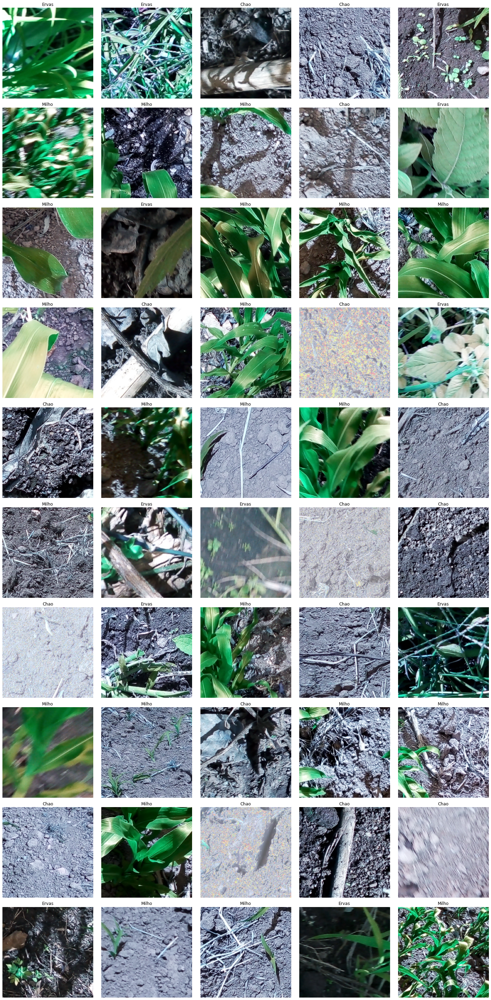

In [3]:
def plot_images_grid(X_data, y_data, num_rows, num_cols):
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 40))
    for i, ax in enumerate(axes.flat):
        img = X_data[i][0]  # Extraire l'image de son tableau (car X_data est une liste de tableaux)
        label = y_data[i][0]  # Extraire l'étiquette de son tableau (car y_data est une liste de tableaux)
        ax.imshow(img.astype('uint8'))  # Afficher l'image
        ax.set_title(label)  # Afficher l'étiquette comme titre de l'image
        ax.axis("off")  # Désactiver les axes
    plt.tight_layout()
    plt.show()

# Utilisation de la fonction pour afficher les images avec leurs étiquettes
plot_images_grid(X_train, y_train, 10, 5)

In [11]:
num_classes = 3  # Nombre de classes dans votre ensemble de don
width, height = 224, 224 
num_epochs = 5 
batch_size = 32 
num_features = 64  


**Encodage des variables catégorielle**

In [6]:
# Utiliser LabelEncoder pour mapper les noms de classes à des entiers
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform (y_train)
y_test = label_encoder.transform(y_test)
y_val = label_encoder.transform(y_val)

# Convertir les entiers en encodage one-hot
y_train = to_categorical(y_train, num_classes=3)
y_test = to_categorical(y_test, num_classes=3)
y_val = to_categorical(y_val, num_classes=3)


C:\Users\Ingrid\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


**Normalisation des données**

In [7]:
# Créer un objet MinMaxScaler
scaler = MinMaxScaler()

# Appliquer la normalisation sur les données d'entraînement
X_train_normalized = scaler.fit_transform(X_train.reshape(X_train.shape[0], -1))

# Appliquer la même transformation aux données de validation et de test
X_val_normalized = scaler.transform(X_val.reshape(X_val.shape[0], -1))
X_test_normalized = scaler.transform(X_test.reshape(X_test.shape[0], -1))

# Remettre les données dans leur forme originale
X_train = X_train_normalized.reshape(X_train.shape)
X_val = X_val_normalized.reshape(X_val.shape)
X_test = X_test_normalized.reshape(X_test.shape)


### Construction du modèle pour les CNN avec l'optimizer Adam

In [8]:
# Créer un modèle séquentiel
model = Sequential()

# Module 1
model.add(Conv2D(32, kernel_size=(3,3), input_shape=(224,224,3), data_format='channels_last', activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

# Module 2
model.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))  
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

# Flatten
model.add(Flatten())

# Dense layers
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(3, activation='softmax'))  # Ajuster à 3 pour correspondre au nombre de classes

# Compiler le modèle avec l'optimiseur Adam
model.compile(loss='categorical_crossentropy', optimizer=Adam(lr=0.001, beta_2=0.999, epsilon=1e-7), metrics=['accuracy'])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 222, 222, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 222, 222, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 111, 111, 64)      18496     
                                                                 
 batch_normalization_1 (Bat  (None, 111, 111, 64)      2

In [9]:
tf.config.run_functions_eagerly(True)
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

X_train = np.squeeze(X_train)
X_val = np.squeeze(X_val)
X_test = np.squeeze(X_test)


data_generator = ImageDataGenerator(
                featurewise_center=False,
                featurewise_std_normalization=False,
                rotation_range=10,
                width_shift_range=0.1,
                height_shift_range=0.1, 
                zoom_range=.1,
                horizontal_flip=True)
es = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=True)

In [11]:
history = model.fit_generator(data_generator.flow(X_train, y_train, batch_size),
                             steps_per_epoch=len(X_train)/batch_size,
                             epochs=num_epochs,
                             verbose=2,
                             callbacks=[es],
                             validation_data=(X_val, y_val))

<ipython-input-11-5cebfb07432a>:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(data_generator.flow(X_train, y_train, batch_size),


Epoch 1/10
80/80 - 374s - loss: 0.7223 - accuracy: 0.6905 - val_loss: 1.0294 - val_accuracy: 0.4714 - 374s/epoch - 5s/step
Epoch 2/10
80/80 - 371s - loss: 0.5344 - accuracy: 0.7786 - val_loss: 1.1360 - val_accuracy: 0.3893 - 371s/epoch - 5s/step
Epoch 3/10
80/80 - 379s - loss: 0.4760 - accuracy: 0.8089 - val_loss: 0.8546 - val_accuracy: 0.6214 - 379s/epoch - 5s/step
Epoch 4/10
80/80 - 386s - loss: 0.4555 - accuracy: 0.8144 - val_loss: 0.8125 - val_accuracy: 0.6607 - 386s/epoch - 5s/step
Epoch 5/10
80/80 - 390s - loss: 0.4031 - accuracy: 0.8388 - val_loss: 1.1664 - val_accuracy: 0.4643 - 390s/epoch - 5s/step
Epoch 6/10
80/80 - 392s - loss: 0.3951 - accuracy: 0.8520 - val_loss: 0.5549 - val_accuracy: 0.7500 - 392s/epoch - 5s/step
Epoch 7/10
80/80 - 396s - loss: 0.3799 - accuracy: 0.8505 - val_loss: 0.3378 - val_accuracy: 0.8679 - 396s/epoch - 5s/step
Epoch 8/10
80/80 - 404s - loss: 0.3609 - accuracy: 0.8637 - val_loss: 0.4569 - val_accuracy: 0.8357 - 404s/epoch - 5s/step
Epoch 9/10
80/80

**Visualisation des performances modèle**

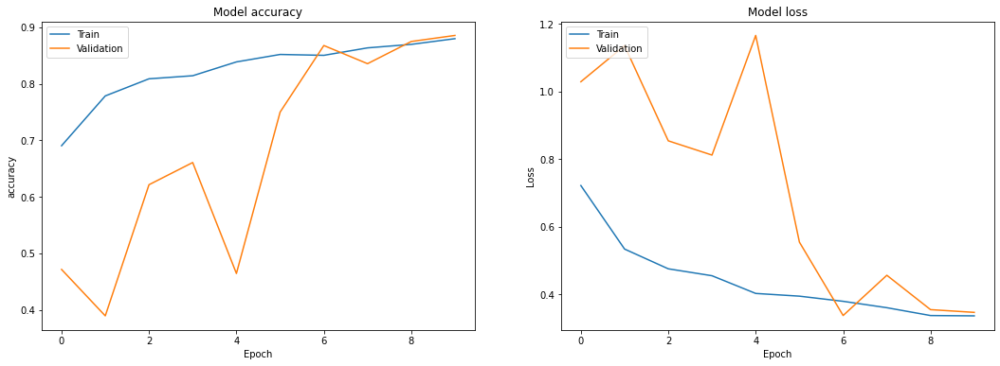

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()


#### Evaluation des performances de test

In [16]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 2s 552ms/step
CNN Model Accuracy on the set: 0.8810


### Matrice de confusion

In [17]:
def plot_confusion_matrix(y_true, y_pred, classes, normalize=None, cmap=plt.cm.Blues, title=None):
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'
            
    # Calculer la matrice de confusion
    cm = confusion_matrix(y_true, y_pred)
    # Utiliser uniquement les étiquettes présentes dans les données 
    classes = classes
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    #else:
        #print("Confusion matrix, without normalization")
    #print(cm)
    
    fig, ax = plt.subplots(figsize=(12,6))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # Nous voulons afficher toutes les marques.
    ax.set(xticks=np.arange(cm.shape[1]), 
           yticks=np.arange(cm.shape[0]),
           # et les étiquettes avec les entrées de la liste respectives.
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')
    # Faire pivoter les étiquettes des graduations et définir leur alignement.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    
    # Parcourir les dimensions des données et créer des annotations textuelles.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


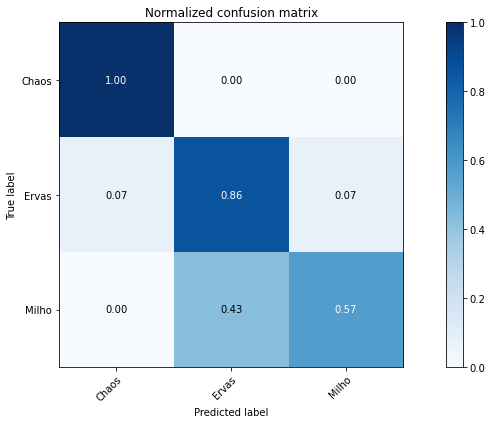

In [23]:
class_labels = ['Chaos', 'Ervas', 'Milho']

plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

## Modele CNN avec l'optimizer RMSprop

In [12]:
from keras.optimizers import RMSprop

# Création du modèle
model_RMSprop = Sequential()

# Module 1
model_RMSprop.add(Conv2D(32, kernel_size=(3,3), input_shape=(224,224,3), data_format='channels_last', activation='relu'))
model_RMSprop.add(BatchNormalization())
model_RMSprop.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model_RMSprop.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

# Module 2
model_RMSprop.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))  
model_RMSprop.add(BatchNormalization())
model_RMSprop.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))
model_RMSprop.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

# Flatten
model_RMSprop.add(Flatten())

# Dense layers
model_RMSprop.add(Dense(128, activation='relu'))
model_RMSprop.add(BatchNormalization())
model_RMSprop.add(Dense(64, activation='relu'))
model_RMSprop.add(BatchNormalization())
model_RMSprop.add(Dense(3, activation='softmax'))  # Correction du nombre de classes à 3

# Compilation du modèle avec RMSprop optimizer
model_RMSprop.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=0.001), metrics=['accuracy'])

model_RMSprop.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 batch_normalization_8 (Bat  (None, 222, 222, 32)      128       
 chNormalization)                                                
                                                                 
 conv2d_9 (Conv2D)           (None, 222, 222, 32)      9248      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 111, 111, 64)      18496     
                                                                 
 batch_normalization_9 (Bat  (None, 111, 111, 64)     

In [13]:
history = model_RMSprop.fit_generator(data_generator.flow(X_train, y_train, batch_size),
                             steps_per_epoch=len(X_train)/batch_size,
                             epochs=num_epochs,
                             verbose=2,
                             callbacks=[es],
                             validation_data=(X_val, y_val))

<ipython-input-13-655947804054>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_RMSprop.fit_generator(data_generator.flow(X_train, y_train, batch_size),
C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/5
80/80 - 401s - loss: 0.7409 - accuracy: 0.6750 - val_loss: 0.9512 - val_accuracy: 0.5143 - 401s/epoch - 5s/step
Epoch 2/5
80/80 - 395s - loss: 0.5658 - accuracy: 0.7643 - val_loss: 0.8195 - val_accuracy: 0.6500 - 395s/epoch - 5s/step
Epoch 3/5
80/80 - 394s - loss: 0.4890 - accuracy: 0.8148 - val_loss: 0.9699 - val_accuracy: 0.4536 - 394s/epoch - 5s/step
Epoch 4/5
80/80 - 481s - loss: 0.4326 - accuracy: 0.8377 - val_loss: 1.0591 - val_accuracy: 0.4536 - 481s/epoch - 6s/step
Epoch 5/5
80/80 - 522s - loss: 0.4175 - accuracy: 0.8435 - val_loss: 0.8094 - val_accuracy: 0.6857 - 522s/epoch - 6s/step


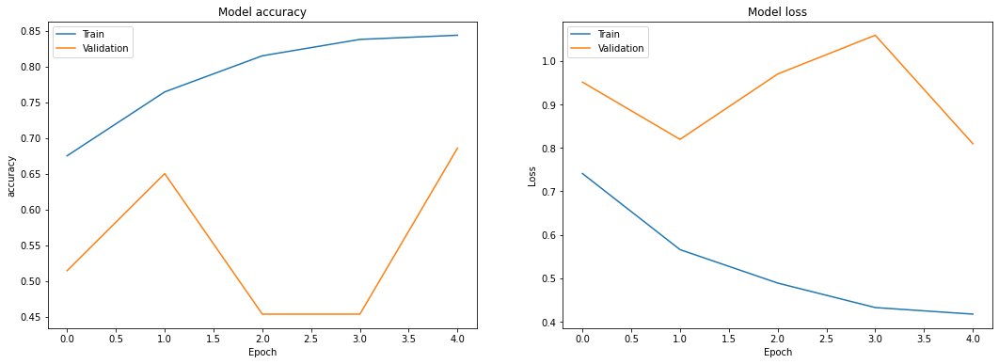

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()


In [19]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model_RMSprop.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 1s 374ms/step
CNN Model Accuracy on the set: 0.8333


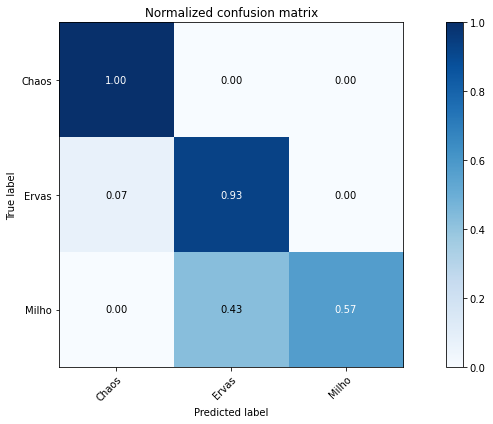

In [20]:
class_labels = ['Chaos', 'Ervas', 'Milho']

plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

## Modele CNN implementé avec l'optimizer Adagrad

In [37]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization
from keras.optimizers import Adagrad

# Création du modèle séquentiel
model_Adagrad = Sequential()

# Module 1
model_Adagrad.add(Conv2D(32, kernel_size=(3,3), input_shape=(224,224,3), data_format='channels_last', activation='relu'))
model_Adagrad.add(BatchNormalization())
model_Adagrad.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model_Adagrad.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

# Module 2
model_Adagrad.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))  
model_Adagrad.add(BatchNormalization())
model_Adagrad.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))
model_Adagrad.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

# Flatten
model_Adagrad.add(Flatten())

# Dense layers
model_Adagrad.add(Dense(128, activation='relu'))
model_Adagrad.add(BatchNormalization())
model_Adagrad.add(Dense(64, activation='relu'))
model_Adagrad.add(BatchNormalization())
model_Adagrad.add(Dense(3, activation='softmax'))  # Nombre de classes = 3

# Compilation du modèle avec l'optimiseur Adagrad
model_Adagrad.compile(loss='categorical_crossentropy', optimizer=Adagrad(),
             metrics=['accuracy'])

model_Adagrad.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_32 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 batch_normalization_32 (Bat  (None, 222, 222, 32)     128       
 chNormalization)                                                
                                                                 
 conv2d_33 (Conv2D)          (None, 222, 222, 32)      9248      
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 111, 111, 64)      18496     
                                                                 
 batch_normalization_33 (Bat  (None, 111, 111, 64)    

In [38]:
history_Adagrad = model_Adagrad.fit_generator(data_generator.flow(X_train, y_train, batch_size),
                             steps_per_epoch=len(X_train)/batch_size,
                             epochs=num_epochs,
                             verbose=2,
                             callbacks=[es],
                             validation_data=(X_val, y_val))

<ipython-input-38-0feee438d699>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_Adagrad = model_Adagrad.fit_generator(data_generator.flow(X_train, y_train, batch_size),


Epoch 1/10
80/80 - 397s - loss: 0.7467 - accuracy: 0.6839 - val_loss: 1.2347 - val_accuracy: 0.3214 - 397s/epoch - 5s/step
Epoch 2/10
80/80 - 363s - loss: 0.5811 - accuracy: 0.7402 - val_loss: 0.9893 - val_accuracy: 0.5071 - 363s/epoch - 5s/step
Epoch 3/10
80/80 - 370s - loss: 0.5586 - accuracy: 0.7542 - val_loss: 0.9652 - val_accuracy: 0.5821 - 370s/epoch - 5s/step
Epoch 4/10
80/80 - 372s - loss: 0.5182 - accuracy: 0.7860 - val_loss: 0.8061 - val_accuracy: 0.6071 - 372s/epoch - 5s/step
Epoch 5/10
80/80 - 374s - loss: 0.4878 - accuracy: 0.7926 - val_loss: 0.7495 - val_accuracy: 0.6571 - 374s/epoch - 5s/step
Epoch 6/10
80/80 - 6452s - loss: 0.4945 - accuracy: 0.7969 - val_loss: 0.5935 - val_accuracy: 0.7321 - 6452s/epoch - 80s/step
Epoch 7/10
80/80 - 362s - loss: 0.4621 - accuracy: 0.8062 - val_loss: 0.7064 - val_accuracy: 0.6536 - 362s/epoch - 4s/step
Epoch 8/10
80/80 - 361s - loss: 0.4500 - accuracy: 0.8148 - val_loss: 0.4766 - val_accuracy: 0.7750 - 361s/epoch - 4s/step
Epoch 9/10
80

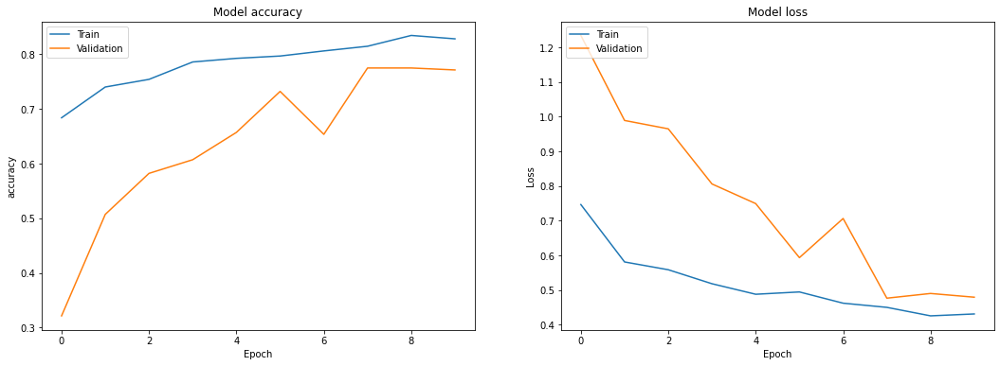

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history_Adagrad.history['accuracy'])
axes[0].plot(history_Adagrad.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history_Adagrad.history['loss'])
axes[1].plot(history_Adagrad.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()

In [43]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model_Adagrad.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 1s 320ms/step
CNN Model Accuracy on the set: 0.6905


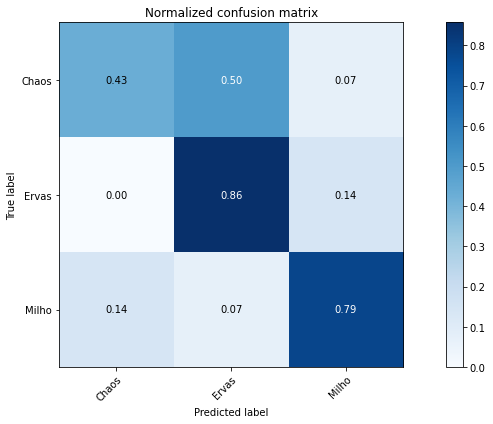

In [44]:
class_labels = ['Chaos', 'Ervas', 'Milho']

plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

## Modele CNN implementé avec différent taux de dropout

In [45]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

# Définir le taux de dropout
dropout_rate = 0.3

# Création du modèle séquentiel
model1 = Sequential()

# Module 1
model1.add(Conv2D(32, kernel_size=(3,3), input_shape=(224,224,3), data_format='channels_last', activation='relu'))
model1.add(BatchNormalization())
model1.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model1.add(Dropout(dropout_rate))  # Ajout de Dropout après le premier module Convolutional

# Module 2
model1.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))  
model1.add(BatchNormalization())
model1.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model1.add(Dropout(dropout_rate))  # Ajout de Dropout après le deuxième module Convolutional

# Flatten
model1.add(Flatten())

# Dense layers
model1.add(Dense(128, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(dropout_rate))  # Ajout de Dropout avant la dernière couche Dense
model1.add(Dense(64, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dense(num_classes, activation='softmax'))  # Ajout de la dernière couche de sortie

# Compilation du modèle avec l'optimiseur Adam
model1.compile(loss='categorical_crossentropy', optimizer=Adam(),
              metrics=['accuracy'])




In [46]:
# Entraînement du modèle
batch_size = 32
num_epochs = 10
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history1 = model1.fit(X_train, y_train, batch_size=batch_size, epochs=num_epochs,
                    validation_data=(X_val, y_val), callbacks=[early_stopping],
                    verbose=1)

Epoch 1/10
81/81 [==============================] - 381s 5s/step - loss: 0.8383 - accuracy: 0.6272 - val_loss: 1.0269 - val_accuracy: 0.4036
Epoch 2/10
81/81 [==============================] - 384s 5s/step - loss: 0.6265 - accuracy: 0.7363 - val_loss: 1.4263 - val_accuracy: 0.3321
Epoch 3/10
81/81 [==============================] - 396s 5s/step - loss: 0.5313 - accuracy: 0.7829 - val_loss: 0.7545 - val_accuracy: 0.5857
Epoch 4/10
81/81 [==============================] - 397s 5s/step - loss: 0.4810 - accuracy: 0.8132 - val_loss: 1.1722 - val_accuracy: 0.3821
Epoch 5/10
81/81 [==============================] - 396s 5s/step - loss: 0.4012 - accuracy: 0.8404 - val_loss: 0.5315 - val_accuracy: 0.7500
Epoch 6/10
81/81 [==============================] - 374s 5s/step - loss: 0.3664 - accuracy: 0.8602 - val_loss: 0.5422 - val_accuracy: 0.7643
Epoch 7/10
81/81 [==============================] - 369s 5s/step - loss: 0.3080 - accuracy: 0.8874 - val_loss: 0.4079 - val_accuracy: 0.8643
Epoch 8/10
81

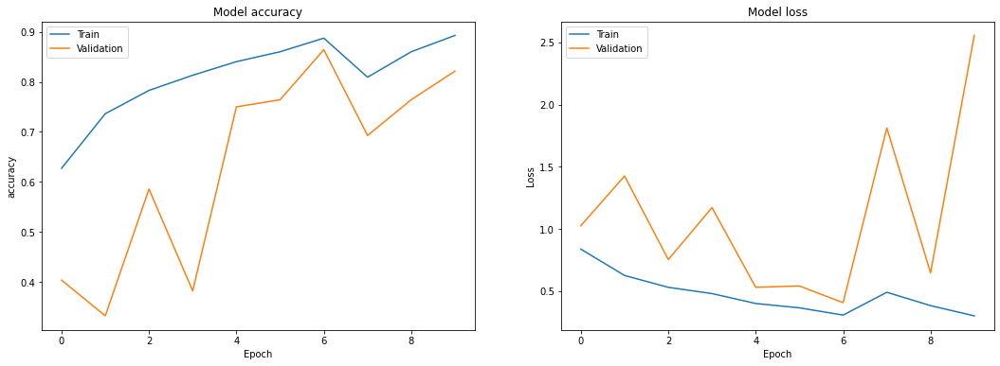

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history1.history['accuracy'])
axes[0].plot(history1.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history1.history['loss'])
axes[1].plot(history1.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()

In [48]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model1.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 1s 317ms/step
CNN Model Accuracy on the set: 0.8333


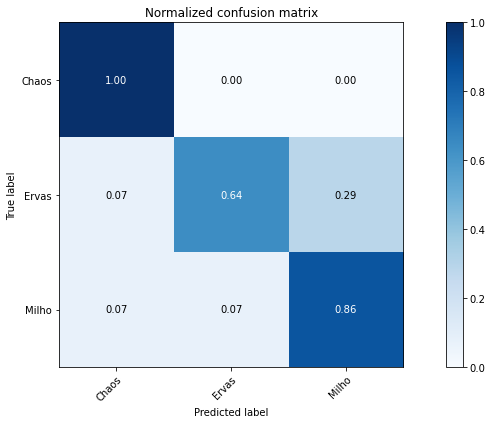

In [49]:
class_labels = ['Chaos', 'Ervas', 'Milho']

plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

In [15]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

# Définir le taux de dropout
dropout_rate = 0.5

# Création du modèle séquentiel
model = Sequential()

# Module 1
model.add(Conv2D(32, kernel_size=(3,3), input_shape=(224,224,3), data_format='channels_last', activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(dropout_rate))  # Ajout de Dropout après le premier module Convolutional

# Module 2
model.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))  
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(dropout_rate))  # Ajout de Dropout après le deuxième module Convolutional

# Flatten
model.add(Flatten())

# Dense layers
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(dropout_rate))  # Ajout de Dropout avant la dernière couche Dense
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(num_classes, activation='softmax'))  # Ajout de la dernière couche de sortie

# Compilation du modèle avec l'optimiseur Adam
model.compile(loss='categorical_crossentropy', optimizer=Adam(),
              metrics=['accuracy'])

# Entraînement du modèle
batch_size = 32
num_epochs = 10
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(X_train, y_train, batch_size=batch_size, epochs=num_epochs,
                    validation_data=(X_val, y_val), callbacks=[early_stopping],
                    verbose=1)


C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:254: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/10
81/81 [==============================] - 444s 5s/step - loss: 0.8810 - accuracy: 0.6299 - val_loss: 1.0261 - val_accuracy: 0.4036
Epoch 2/10
81/81 [==============================] - 413s 5s/step - loss: 0.6124 - accuracy: 0.7511 - val_loss: 1.2649 - val_accuracy: 0.3429
Epoch 3/10
81/81 [==============================] - 411s 5s/step - loss: 0.5315 - accuracy: 0.7938 - val_loss: 0.9939 - val_accuracy: 0.3821
Epoch 4/10
81/81 [==============================] - 415s 5s/step - loss: 0.4764 - accuracy: 0.8128 - val_loss: 0.9920 - val_accuracy: 0.5321
Epoch 5/10
81/81 [==============================] - 419s 5s/step - loss: 0.4474 - accuracy: 0.8241 - val_loss: 1.3465 - val_accuracy: 0.4000
Epoch 6/10
81/81 [==============================] - 424s 5s/step - loss: 0.3906 - accuracy: 0.8548 - val_loss: 2.7630 - val_accuracy: 0.6071
Epoch 7/10
81/81 [==============================] - 424s 5s/step - loss: 0.3964 - accuracy: 0.8520 - val_loss: 0.6396 - val_accuracy: 0.7321
Epoch 8/10
81

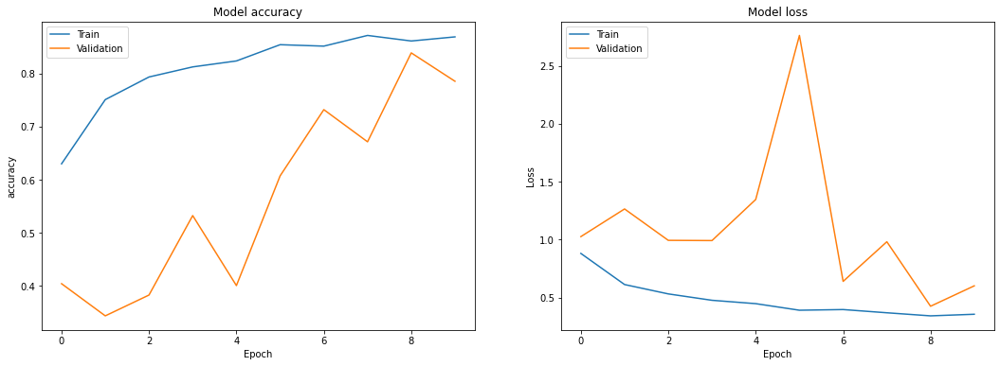

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()

In [18]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 1s 374ms/step
CNN Model Accuracy on the set: 0.8095


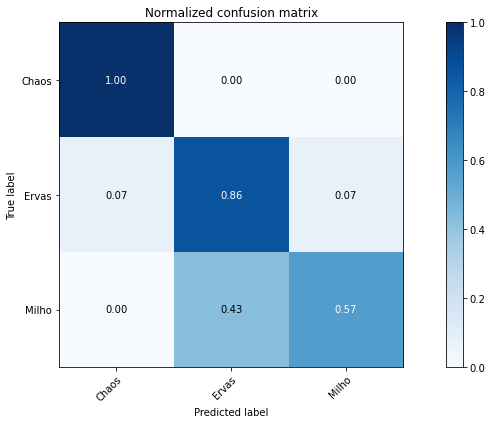

In [24]:
class_labels = ['Chaos', 'Ervas', 'Milho']

plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

### Utilisation des modèle pré-entrainé

In [25]:
from keras.applications import VGG16
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.optimizers import Adam

# Charger le modèle pré-entraîné VGG16 sans les couches fully-connected
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Créer un nouveau modèle en ajoutant des couches fully-connected au dessus du modèle de base
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))  # Adapter la sortie en fonction du nombre de classes

# Geler les poids du modèle de base pour empêcher l'entraînement
base_model.trainable = False

# Compiler le modèle
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Afficher un résumé du modèle
model.summary()

# Entraîner le modèle avec les données d'entraînement
history = model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_data=(X_val, y_val))


58889256/58889256 [==============================] - 50s 1us/step
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 25088)             0         
                                                                 
 dense_8 (Dense)             (None, 256)               6422784   
                                                                 
 dense_9 (Dense)             (None, 3)                 771       
                                                                 
Total params: 21,138,243
Trainable params: 6,423,555
Non-trainable params: 14,714,688
_________________________________________________________________
Epoch 1/10
81/81 [==============================] - 1980s 24s/step - loss: 0.8094 - accuracy: 0.7631

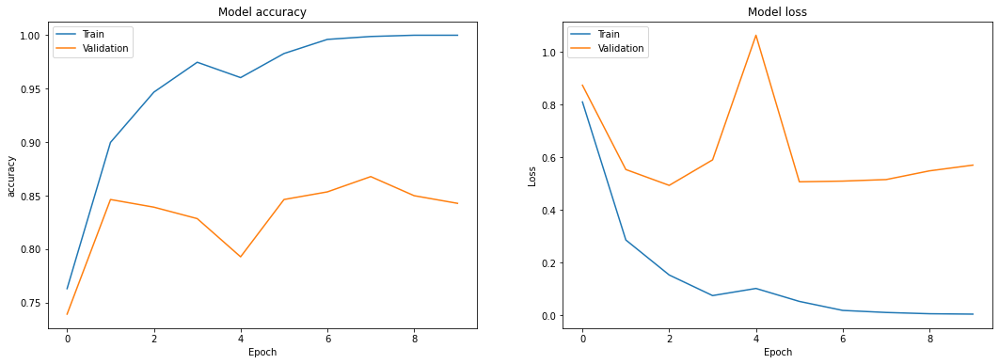

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()

In [28]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 7s 2s/step
CNN Model Accuracy on the set: 0.9524


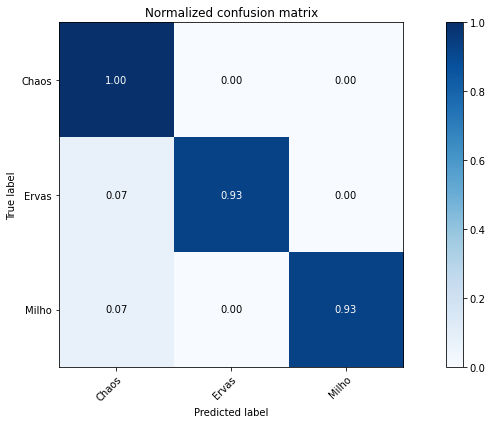

In [29]:
class_labels = ['Chaos', 'Ervas', 'Milho']

plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

In [21]:
from keras.applications import VGG19
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.optimizers import Adam

# Charger le modèle pré-entraîné VGG19 sans les couches fully-connected
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


# Créer un nouveau modèle en ajoutant des couches fully-connected au dessus du modèle de base
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))  # Adapter la sortie en fonction du nombre de classes

# Geler les poids du modèle de base pour empêcher l'entraînement
base_model.trainable = False

# Compiler le modèle
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Afficher un résumé du modèle
model.summary()

# Entraîner le modèle avec les données d'entraînement
history = model.fit(X_train, y_train, epochs=6, batch_size=batch_size, validation_data=(X_val, y_val))


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_3 (Flatten)         (None, 25088)             0         
                                                                 
 dense_9 (Dense)             (None, 256)               6422784   
                                                                 
 dense_10 (Dense)            (None, 3)                 771       
                                                                 
Total params: 26447939 (100.89 MB)
Trainable params: 6423555 (24.50 MB)
Non-trainable params: 20024384 (76.39 MB)
_________________________________________________________________
Epoch 1/6
81/81 [==============================] - 2606s 32s/step - loss: 1.0320 - accuracy: 0.7196 - val_loss: 0.3937 - val_accuracy: 0.8

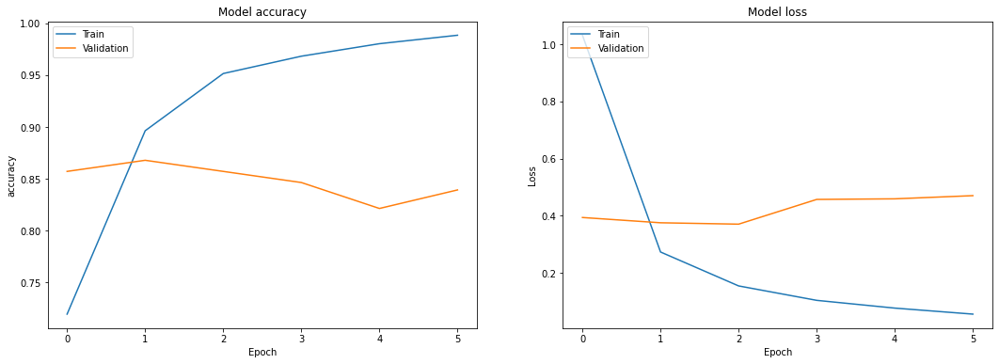

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()

In [23]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 9s 2s/step
CNN Model Accuracy on the set: 0.7857


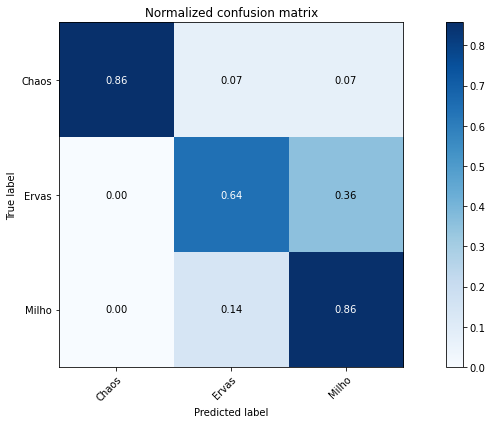

In [24]:
class_labels = ['Chaos', 'Ervas', 'Milho']

plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

In [25]:
from keras.applications import Xception
from keras.models import Sequential
from keras.layers import Dense, GlobalAveragePooling2D

# Charger le modèle pré-entraîné Xception sans les couches fully-connected
base_model = Xception(weights='imagenet', include_top=False)

# Créer un modèle Sequential et ajouter le modèle de base Xception
model = Sequential()
model.add(base_model)

# Ajouter une couche de Global Average Pooling pour réduire le nombre de paramètres
model.add(GlobalAveragePooling2D())

# Ajouter une couche fully-connected avec activation softmax pour la classification
model.add(Dense(num_classes, activation='softmax'))  # Adapter la sortie en fonction du nombre de classes

# Geler les poids du modèle de base pour empêcher l'entraînement
base_model.trainable = False

# Compiler le modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Afficher un résumé du modèle
model.summary()

83683744/83683744 [==============================] - 32s 0us/step
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, None, None, 2048   20861480  
                             )                                   
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_11 (Dense)            (None, 3)                 6147      
                                                                 
Total params: 20867627 (79.60 MB)
Trainable params: 6147 (24.01 KB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


In [26]:
# Entraîner le modèle avec les données d'entraînement
history = model.fit(X_train, y_train, epochs=6, batch_size=batch_size, validation_data=(X_val, y_val))

Epoch 1/6
81/81 [==============================] - 1209s 15s/step - loss: 0.5420 - accuracy: 0.8105 - val_loss: 0.3979 - val_accuracy: 0.8357
Epoch 2/6
81/81 [==============================] - 1074s 13s/step - loss: 0.3386 - accuracy: 0.8792 - val_loss: 0.3685 - val_accuracy: 0.8643
Epoch 3/6
81/81 [==============================] - 1323s 16s/step - loss: 0.2996 - accuracy: 0.8905 - val_loss: 0.3292 - val_accuracy: 0.8571
Epoch 4/6
81/81 [==============================] - 1154s 14s/step - loss: 0.2678 - accuracy: 0.9045 - val_loss: 0.3277 - val_accuracy: 0.8607
Epoch 5/6
81/81 [==============================] - 1121s 14s/step - loss: 0.2500 - accuracy: 0.9157 - val_loss: 0.3053 - val_accuracy: 0.8607
Epoch 6/6
81/81 [==============================] - 1142s 14s/step - loss: 0.2276 - accuracy: 0.9250 - val_loss: 0.3060 - val_accuracy: 0.8571


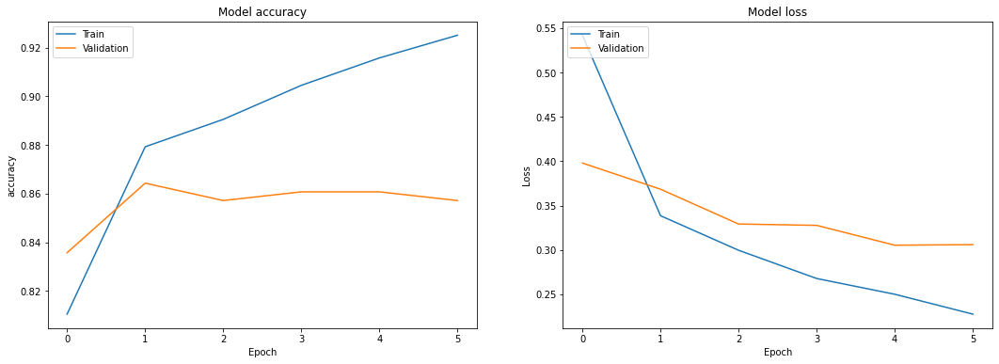

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(history.history['accuracy'])
axes[0].plot(history.history['val_accuracy'])
axes[0].set_title('Model accuracy')
axes[0].set_ylabel('accuracy')
axes[0].set_xlabel('Epoch')
axes[0].legend(['Train', 'Validation'], loc='upper left')  

axes[1].plot(history.history['loss'])
axes[1].plot(history.history['val_loss'])
axes[1].set_title('Model loss')
axes[1].set_ylabel('Loss')
axes[1].set_xlabel('Epoch')
axes[1].legend(['Train', 'Validation'], loc='upper left') 
plt.show()

In [28]:
test_true = np.argmax(y_test, axis=1)  # Supposant que y_test contient les étiquettes correctes
test_pred = np.argmax(model.predict(X_test), axis=1)
print("CNN Model Accuracy on the set: {:.4f}".format(accuracy_score(test_true, test_pred)))

2/2 [==============================] - 5s 1s/step
CNN Model Accuracy on the set: 0.9286


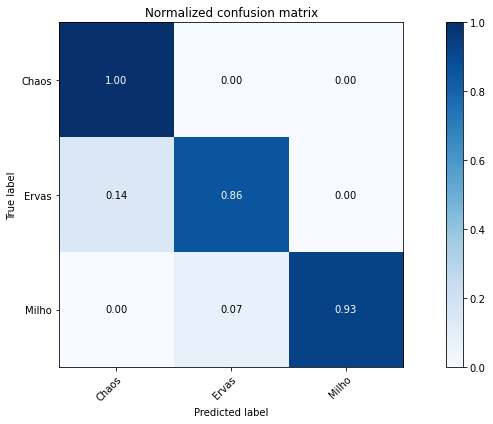

In [35]:
plot_confusion_matrix(test_true, test_pred, classes=class_labels,
normalize=True, title='Normalized confusion matrix')
plt.show()

La classe 2 n'a pas suffisamment d'échantillons pour sélectionner 3 échantillons.


C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 766ms/step


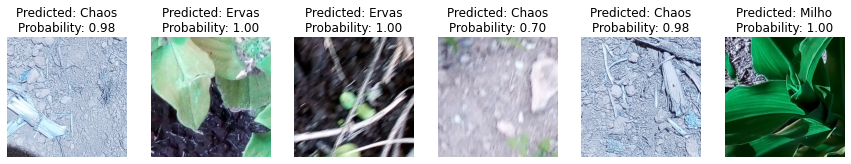

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


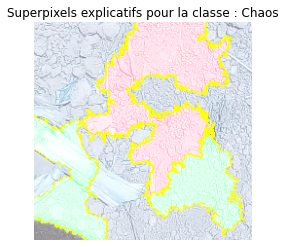

  0%|          | 0/1000 [00:00<?, ?it/s]

C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step


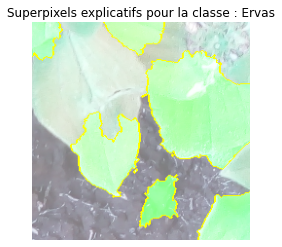

  0%|          | 0/1000 [00:00<?, ?it/s]

C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step


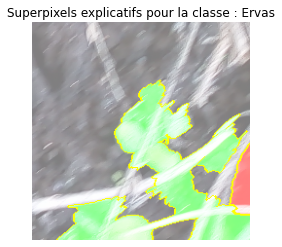

  0%|          | 0/1000 [00:00<?, ?it/s]

C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step


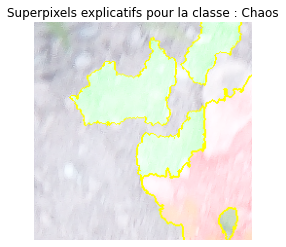

  0%|          | 0/1000 [00:00<?, ?it/s]

C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step


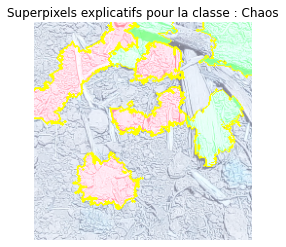

  0%|          | 0/1000 [00:00<?, ?it/s]

C:\Users\Ingrid\anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:265: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step


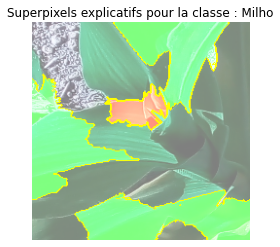

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Fonction pour afficher les images avec les probabilités prédites
def show_images_with_predictions(images, predictions, class_labels):
    num_images = len(images)
    plt.figure(figsize=(15, 5))
    for i in range(num_images):
        plt.subplot(1, num_images, i+1)
        plt.imshow(images[i])
        plt.axis('off')
        predicted_class = np.argmax(predictions[i])
        plt.title(f"Predicted: {class_labels[predicted_class]}\nProbability: {predictions[i][predicted_class]:.2f}")
    plt.show()

# Fonction pour afficher les superpixels explicatifs en utilisant LIME
def explain_with_lime(model, image, class_labels):
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(image, model.predict, top_labels=1, hide_color=0, num_samples=1000)
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
    plt.title(f"Superpixels explicatifs pour la classe : {class_labels[explanation.top_labels[0]]}")
    plt.axis('off')
    plt.show()

# Exemple de sélection de quelques images de test supplémentaires
# Exemple de sélection de quelques images de test supplémentaires
num_samples_per_class = 3
selected_images = []
selected_labels = []
for class_index in range(len(class_labels)):
    class_indices = np.where(y_test == class_index)[0]
    if len(class_indices) >= num_samples_per_class:
        selected_indices = np.random.choice(class_indices, num_samples_per_class, replace=False)
        selected_images.extend(X_test[selected_indices])
        selected_labels.extend([class_index] * num_samples_per_class)
    else:
        print(f"La classe {class_index} n'a pas suffisamment d'échantillons pour sélectionner {num_samples_per_class} échantillons.")

# Convertir les images sélectionnées en tableaux NumPy
selected_images = np.array(selected_images)

# Prédire les classes pour les images sélectionnées à l'aide du modèle entraîné
predictions = model.predict(selected_images)

# Afficher les images avec les probabilités prédites
show_images_with_predictions(selected_images, predictions, class_labels)

# Afficher les superpixels explicatifs en utilisant LIME pour chaque image
for i in range(len(selected_images)):
    explain_with_lime(model, selected_images[i], class_labels)
